In [26]:
import torch
from torch import nn
import matplotlib.pyplot as plt
import numpy as np
import time

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device = "cpu"
device

'cpu'

## Neural Network Model

In [27]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.layers = nn.Sequential(
        nn.Linear(1,10),
        nn.Sigmoid(),
        nn.Linear(10,1, bias=False)
        )
        
    def forward(self, x):
        N = self.layers(x)
        return N

In [28]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model.parameters(), 2)
    optimizer.step(closure)   

### Differential equation
$$\frac{d^2\phi(r)}{dr^2} + \frac{2m}{\hbar^2}\left(E-\frac{l(l+1)}{2mr^2}\hbar^2+V(r)\right)\phi(r) = 0$$ 
Dataset are vectors of domain of differential equation, like the vectors are one-dimentional, the shape of dataset is one by m samples. Trial solution $\phi_t(r) = e^{-\beta r^2}N(r,\vec{p})$, with $\phi(r=0) = 0$ and $\phi(r\rightarrow\infty) = 0$ as boundary conditions.  

In [29]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0

V = lambda r: -(Z*e**2)/r
Phi_t = lambda r: r*torch.exp(-beta*r) * model.forward(r)

In [30]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data)

In [31]:
def loss_fn(r):
    r.requires_grad = True
    
    Phi = Phi_t(r)    
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6

    prom = Phi.size()[0]
    
    global E
    E = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [32]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 2e-2
Phis_t = []
Es = []
lss = []
epochs = []



start = time.time()

model = NeuralNetwork().to(device)
initialize_weights(model)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
for t in range(epoch):
    loss = loss_fn(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss}")
    training(R_train, loss_fn, optimizer)
    if t%100 == 0:
        Phis_t.append(Phi_t(R_train).detach().numpy())
        Es.append(E.detach().numpy())
        lss.append(loss.detach().numpy())
        epochs.append(t)
Es = np.squeeze(Es)
lss = np.squeeze(lss)
Phis_t = np.squeeze(Phis_t)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([107.9176], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([99.3831], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([90.9153], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([82.2150], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([73.0686], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([63.3353], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([52.8452], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([41.4238], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([29.0565], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([16.4062], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([6.3901], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([9.3518], grad_fn=<DivBackward0>)
Epoch 13
 ---------------------- loss:

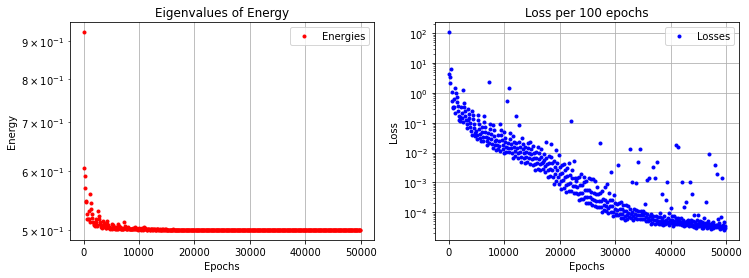

In [33]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs, 1+Es, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs, lss, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

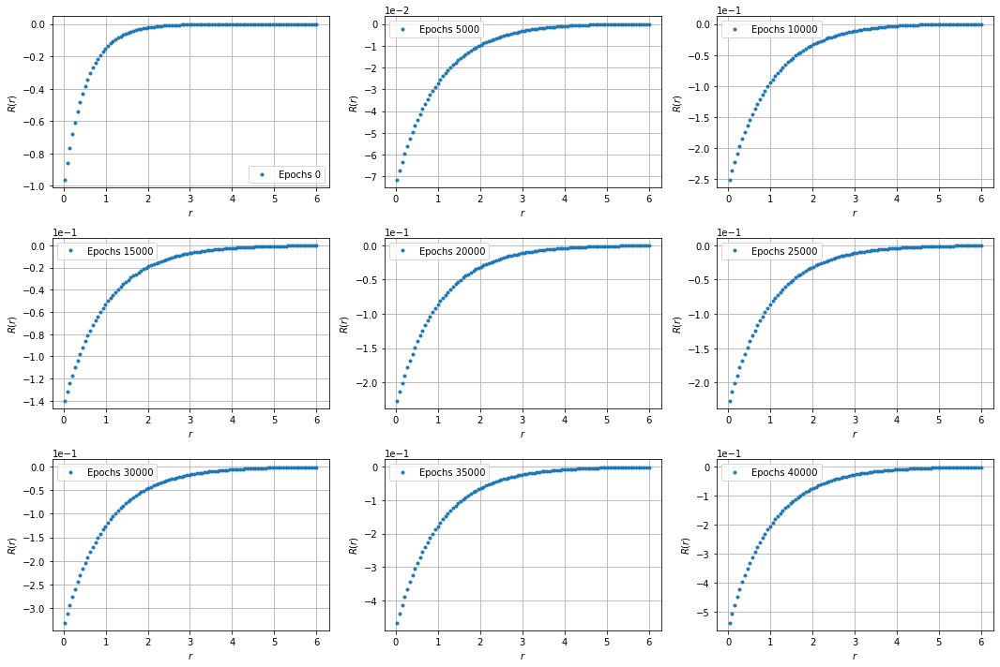

In [34]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [35]:
Es

array([-0.07440901, -0.39326727, -0.40882558, -0.43079022, -0.45502037,
       -0.45336014, -0.47412583, -0.48295337, -0.48316053, -0.4696207 ,
       -0.48192382, -0.48808998, -0.44077095, -0.45611107, -0.46700037,
       -0.47513667, -0.4816004 , -0.48665366, -0.49021867, -0.49255234,
       -0.49108046, -0.49342772, -0.482748  , -0.4881415 , -0.4915344 ,
       -0.4936835 , -0.46957305, -0.47697592, -0.48289728, -0.48708847,
       -0.4903676 , -0.49288896, -0.49470472, -0.4959395 , -0.49649233,
       -0.48532045, -0.4892344 , -0.4920343 , -0.49416396, -0.49571654,
       -0.49677762, -0.49748445, -0.4863628 , -0.49021536, -0.4927461 ,
       -0.49467126, -0.49611667, -0.49713272, -0.4978105 , -0.4969901 ,
       -0.497598  , -0.4981544 , -0.48979497, -0.49288118, -0.4948472 ,
       -0.4962902 , -0.49731982, -0.49801254, -0.49846405, -0.4958238 ,
       -0.49708042, -0.497917  , -0.49844778, -0.49103567, -0.49395344,
       -0.49574795, -0.49700037, -0.49787596, -0.49845612, -0.49

In [36]:
np.mean(Es)

-0.49667877

In [37]:
norm = torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)
norm = norm.detach()
norm

tensor([0.1134])

In [38]:
torch.trapezoid(Phi_t(R_train)[100:]**2,R_train[100:],dim=0)/norm

tensor([1.], grad_fn=<DivBackward0>)

In [39]:
Phi_0 = Phi_t(R_train)
#Phi_0 = Phi_0/torch.sqrt(norm)
Phi_0 = Phi_0.detach()
new = torch.trapezoid(Phi_0[100:]**2,R_train[100:],dim=0)
new

tensor([0.1134], grad_fn=<DivBackward1>)

In [40]:
Phi_0

tensor([[-8.3451e+04],
        [-7.2395e+04],
        [-6.2777e+04],
        [-5.4413e+04],
        [-4.7141e+04],
        [-4.0821e+04],
        [-3.5330e+04],
        [-3.0562e+04],
        [-2.6423e+04],
        [-2.2831e+04],
        [-1.9715e+04],
        [-1.7014e+04],
        [-1.4673e+04],
        [-1.2645e+04],
        [-1.0889e+04],
        [-9.3692e+03],
        [-8.0550e+03],
        [-6.9190e+03],
        [-5.9376e+03],
        [-5.0903e+03],
        [-4.3592e+03],
        [-3.7289e+03],
        [-3.1858e+03],
        [-2.7182e+03],
        [-2.3160e+03],
        [-1.9703e+03],
        [-1.6734e+03],
        [-1.4187e+03],
        [-1.2004e+03],
        [-1.0135e+03],
        [-8.5370e+02],
        [-7.1723e+02],
        [-6.0083e+02],
        [-5.0169e+02],
        [-4.1740e+02],
        [-3.4584e+02],
        [-2.8521e+02],
        [-2.3394e+02],
        [-1.9068e+02],
        [-1.5427e+02],
        [-1.2371e+02],
        [-9.8126e+01],
        [-7.6789e+01],
        [-5

In [41]:
file_Phi = open("file.txt","w")
for row in Phi_0:
    np.savetxt(file_Phi, row)
file_Phi.close() 

In [42]:
model_1 = NeuralNetwork()
model_1

NeuralNetwork(
  (layers): Sequential(
    (0): Linear(in_features=1, out_features=10, bias=True)
    (1): Sigmoid()
    (2): Linear(in_features=10, out_features=1, bias=False)
  )
)

In [43]:
def training(x, loss_fn, optimizer):
    x = x.to(device)
    def closure():
        loss = loss_fn(x)
        optimizer.zero_grad()
        loss.backward()
        return loss
    torch.nn.utils.clip_grad_value_(model_1.parameters(), 2)
    optimizer.step(closure)   

In [44]:
beta = 2
global Z
Z = 1
global e
#e = -1.602e-19
e = -1
global hbar
#hbar = 1.054e-34
hbar = 1
global m
#m = 9.109e-31
m = 1
global l
l = 0
global Phi_0

V = lambda r: -(Z*e**2)/r
Phi_aux = lambda r: r*torch.exp(-beta*r) * model_1.forward(r)
Phi_t_1 = lambda r: Phi_aux(r) - Phi_0*torch.trapezoid(Phi_0[100:]*Phi_aux(r)[100:], r[100:],dim=0)

In [45]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Linear)):
            nn.init.xavier_normal_(m.weight.data, gain=0.50)

In [46]:
def loss_fn_1(r):
    r.requires_grad = True
    
    Phi = Phi_t_1(r)
    Phi_t_r = torch.autograd.grad(Phi, r, grad_outputs=torch.ones_like(Phi), create_graph=True)[0]
    Phi_t_r_r = torch.autograd.grad(Phi_t_r, r, grad_outputs=torch.ones_like(Phi_t_r), create_graph=True)[0]
    H_Phi = -(hbar**2/(2*m))*Phi_t_r_r + (l*(l+1)*hbar**2/(2*m*r**2) + V(r))*Phi
    
    prom = Phi.size()[0]
    
    norm = torch.trapezoid(Phi[100:]**2,r[100:],dim=0) # integral over r=0 to 6
    
    global E_1
    E_1 = torch.trapezoid(Phi[100:]*H_Phi[100:],r[100:],dim=0)/norm 
    
    
    return (torch.mean((H_Phi[100:] - E_1*Phi[100:])**2)*prom)/norm #multiply by m to avoit division by m in the mean function of torh 

In [47]:
upper_r = 6
lower_r = -6
steps = 200
R_train = torch.Tensor(np.linspace(lower_r, upper_r, steps)[:,None])
epoch = 50000
lr = 5e-2
Phis_t_1 = []
Es_1 = []
lss_1 = []
epochs_1 = []



start = time.time()

model_1 = NeuralNetwork().to(device)
initialize_weights(model_1)
optimizer_1 = torch.optim.Adam(model_1.parameters(), lr=1)
for t in range(epoch):
    loss_1 = loss_fn_1(R_train.to(device))
    print(f"Epoch {t+1}\n ---------------------- loss: {loss_1}")
    training(R_train, loss_fn_1, optimizer_1)
    if t%100 == 0:
        Phis_t_1.append(Phi_t_1(R_train).detach().numpy())
        Es_1.append(E_1.detach().numpy())
        lss_1.append(loss_1.detach().numpy())
        epochs_1.append(t)
Es_1 = np.squeeze(Es_1)
lss_1 = np.squeeze(lss_1)
Phis_t_1 = np.squeeze(Phis_t_1)
print("Done!")

end = time.time()
print(end - start)

Epoch 1
 ---------------------- loss: tensor([1.6337e+10], grad_fn=<DivBackward0>)
Epoch 2
 ---------------------- loss: tensor([1.2165e+10], grad_fn=<DivBackward0>)
Epoch 3
 ---------------------- loss: tensor([1.1815e+10], grad_fn=<DivBackward0>)
Epoch 4
 ---------------------- loss: tensor([1.1559e+10], grad_fn=<DivBackward0>)
Epoch 5
 ---------------------- loss: tensor([1.1383e+10], grad_fn=<DivBackward0>)
Epoch 6
 ---------------------- loss: tensor([1.1179e+10], grad_fn=<DivBackward0>)
Epoch 7
 ---------------------- loss: tensor([1.0843e+10], grad_fn=<DivBackward0>)
Epoch 8
 ---------------------- loss: tensor([1.0270e+10], grad_fn=<DivBackward0>)
Epoch 9
 ---------------------- loss: tensor([9.3765e+09], grad_fn=<DivBackward0>)
Epoch 10
 ---------------------- loss: tensor([8.2022e+09], grad_fn=<DivBackward0>)
Epoch 11
 ---------------------- loss: tensor([6.9622e+09], grad_fn=<DivBackward0>)
Epoch 12
 ---------------------- loss: tensor([5.8978e+09], grad_fn=<DivBackward0>)
E

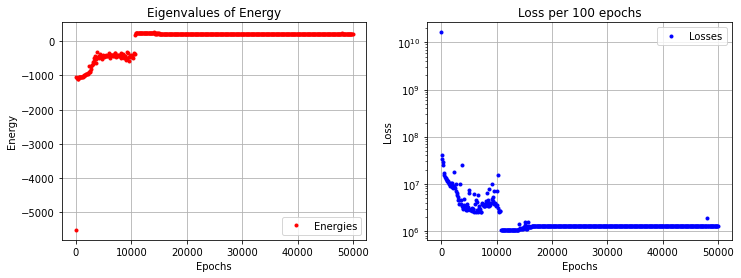

In [48]:
plt.subplots(1,2,figsize=(12,4))
plt.subplot(121)
plt.plot(epochs_1, Es_1, "r.", label="Energies")
plt.title("Eigenvalues of Energy")
#plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Energy")
plt.grid()
plt.legend(loc="best")
plt.subplot(122)
plt.plot(epochs_1, lss_1, "b.", label="Losses")
plt.title("Loss per 100 epochs")
plt.yscale("log")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.grid()
plt.legend(loc="best")
plt.show()

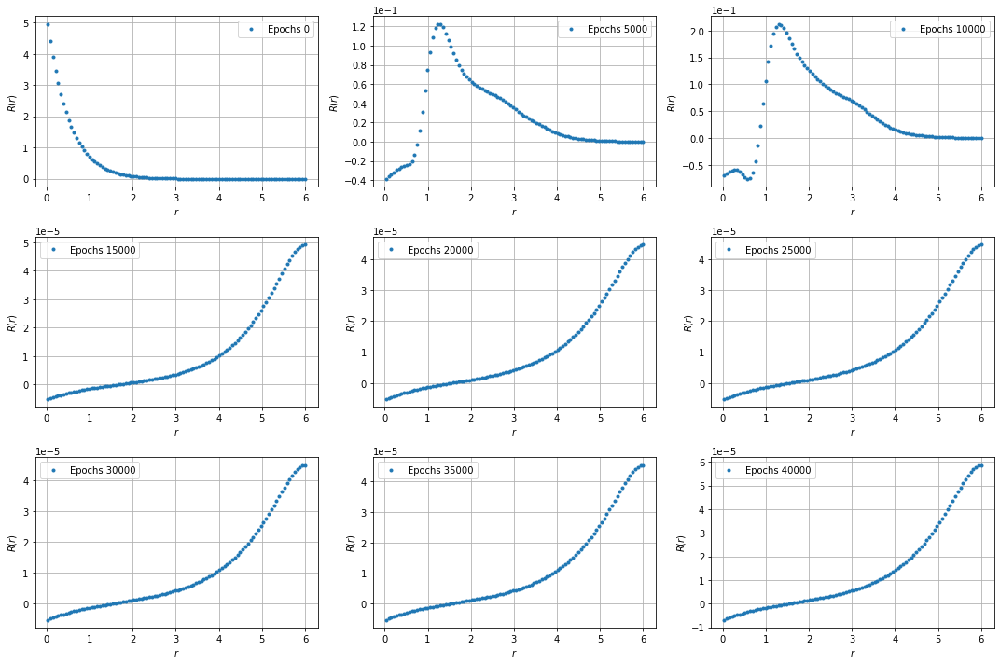

In [49]:
rr = np.linspace(lower_r, upper_r, steps)[:,None]
fig, axs = plt.subplots(3,3,figsize=(15,10))

fil = 0
col = 0
for i in range(0,9):
    yy = Phis_t_1[50*i]
    yy = yy.reshape((200,1))
    axs[fil,col].plot(rr[100:], np.divide(yy[100:], rr[100:]), ".", label=f"Epochs {epochs[50*i]}")
    axs[fil,col].set_xlabel("$r$")
    axs[fil,col].set_ylabel("$R(r)$")
    axs[fil,col].legend(loc="best")
    axs[fil,col].ticklabel_format(style='sci', axis='y', scilimits=(0,0))
    axs[fil,col].grid()
    if col == 2:
       col = 0
       fil = fil+1
    else:
       col = col+1
plt.tight_layout()
plt.show()  

In [50]:
Es_1

array([-5512.861  , -1049.1123 , -1087.7782 , -1091.7886 , -1104.4739 ,
       -1042.5465 , -1049.0698 , -1052.0277 , -1053.6364 , -1053.2288 ,
       -1049.7168 , -1043.898  , -1036.0963 , -1026.1261 , -1013.2359 ,
        -996.22375,  -974.1947 ,  -974.84235,  -967.14386,  -945.7726 ,
        -954.492  ,  -947.0697 ,  -928.07635,  -737.93115,  -907.6204 ,
        -900.44904,  -870.2177 ,  -798.80066,  -735.6946 ,  -706.429  ,
        -664.3376 ,  -598.19794,  -487.9525 ,  -564.9442 ,  -433.57748,
        -502.1047 ,  -636.2707 ,  -525.70166,  -312.3078 ,  -473.04865,
        -449.81277,  -421.9644 ,  -484.77805,  -383.2157 ,  -430.55478,
        -452.1057 ,  -437.494  ,  -513.485  ,  -430.46048,  -408.40436,
        -438.0249 ,  -451.73914,  -435.66345,  -438.99533,  -429.19147,
        -401.0726 ,  -444.4675 ,  -417.89478,  -391.1522 ,  -349.0424 ,
        -396.41333,  -487.58798,  -391.30814,  -413.50677,  -399.27298,
        -398.93277,  -430.73624,  -415.59567,  -422.75784,  -415